#### ECON323: Quantitative Economic Modelling with Data Science Applications - Final Project

<h1><center>An analysis of implicit carbon emission between provinces in China with Data Science application</center></h1>


### Abstract
Carbon emissions are an important global issue; everyone knows that it is important to control the emissions. But not many consider the responsibility of the demand side of implicit carbon emissions in some regions of China which are using energy transmitted from regions with high carbon emissions. In this project we are trying to help by doing four things in the electricity of China: First, we will replicate the outcome of a previous paper calculating the implicit carbon emissions in China because we have no access to its raw data (therefore we will carry out the data cleaning, calculation and visualization by ourselves). Second, we will use some data science methods to classify the provinces. Third, we will carry out some case studies of typical provinces. Lastly, we will try to give some possible solutions or suggestions from the analysis above.


Note:
There's some problem with the holoviews package that the charts can not show on the jupiter notebook, so we have our charts enclosed in the submission.


For more details and data, please check: https://github.com/Yuetong-Du/projects

### Project Rationale
We chose this project because China is the biggest polluter in the world, as its economy still heavily runs on coal. This is becoming an increasingly urgent issue to address as the impacts of climate change on the world and individual countries are becoming more apparent. Conferences such as COP27 are attempting to find solutions but China is finding it hard to be able to agree on the target of reaching net-zero emissions by 2030 but potentially by 2060. They have so many emissions and sources of emissions that any solutions to minimise this would be beneficial.

### Scope of this project

#### 1. Implicit Carbon Emission Calculation
We are going to replicate some previous papers concerning implicit carbon emissions. Since we have no access to the raw data, we will need to the clean the data we are using. Then we will manipulate the data to produce data visualisations such as bar charts, chord charts, scatter plots, using mathematical linear regression analysis and potentially a world chart.
#### 2. Machine Learning Application
Then we will use machine learning techniques to analyse the outcomes such as K-means and Spectrum Clustering.
#### 3. Analysis and Case Study
We will then conduct some economic analysis (including some economics data).
#### 4. Possible Solution and Suggestions
By analyzing the different situations of the provinces, we will try to propose some possible solutions given the conditions of different provinces to the government.

In [1]:
import numpy as np
import pandas as pd
import os
import xlrd
import msoffcrypto
import io
import matplotlib.pyplot as plt
from holoviews import opts, dim
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
import holoviews as hv
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None)

## 1.Data Cleaning

The data of different kinds of energy consumed for electricity production comes from the [China Energy Statistical Yearbook](http://gfgga22a7519b7d4741d3sofv5n5b69f5x6fpb.fhaz.libproxy.ruc.edu.cn/yearbook/Single/N2016120537).

The scope of the data here includes data from the 30 provinces of China (with Tibet excluded due to limited access to the data there) from 2014 to 2020.


The scope of `energy` here includes Raw Coal, Cleaned Coal, Other Washed Coal, Briquettes, Gangue, Coke, Coke Oven Gas, Blast Furnace Gas, Converter Gas, Other Gas, Other Coking Products, Crude Oil, Gasoline, Kerosene, Diesel Oil, Fuel Oil, Petroleum Coke, LPG, Refinery Gas, Other Petroleum Products, Natural Gas, LNG, Other Energy.

In [3]:
col_1 = ['Raw Coal','Clean Coal',
         'Other Washed Coal','Briquettes',
         'Gangue','Coke','Coke Oven Gas',
         'Blast Furnace Gas','Converter Gas',
         'Other Gas','Other Coking Products',
         'Crude Oil','Gasoline','Kerosene',
         'Diesel Oil','Fuel Oil','Petroleum Coke',
         'LPG','Refinery Gas','Other Petroleum Products',
         'Natural Gas','LNG','Other Energy']

provinces = ['Beijing','Tianjin','Hebei','Shanxi','Inner mongolia','Liaoning',
            'Jilin','Heilongjiang','Shanghai','Jiangsu','Zhejiang','Anhui',
            'Fujian','Jiangxi','Shandong','Henan','Hubei','Hunan','Guangdong',
             'Guangxi','Hainan','Chongqing','Sichuan','Guizhou','Yunnan',
            'Shaanxi','Gansu','Qinghai','Ningxia','Xinjiang']

year = list(range(2014,2020,1))
year_iterable = [i for i in year for j in provinces]
provinces_iterable = [i for j in range(len(year)) for i in provinces ]

In [4]:
production_data = pd.DataFrame(columns = col_1 ,index = [year_iterable, provinces_iterable])

transmission_data = pd.DataFrame(columns = provinces, index = [year_iterable, provinces_iterable])

pro_data = pd.DataFrame(columns = ['Production'], index = [year_iterable, provinces_iterable])

In [5]:
address = os.getcwd()+"\\323\\"

### 1.1 Data of energy used for electricity production 

In [6]:
add_1 = address + "electricity production\\"
year_string = ['2014', '2015', '2016', '2017','2018', '2019']
year_address = [add_1 + i + "\\" for i in year_string]
# year_address

In [7]:
def data_cleaning(add,data_1):
    '''
    input:  the address of the excel to be read
            in each folder, there're 30 excel documents containing how much energy are consumed in each year
            only the line of 'thermal power(which indicates how much energy is consumed for electricity production)
    output: data_1
            a dataframe containing how much energy is consumed in each province for electricity
            the columns are different kinds of energy (listed in the col_1 list)
            the rows are the name of the provinces
    '''
    province = 0 
    # int province as an indicator of provinces because the excel documents are listed with a province sequence
    # the sequence is the same as the 'provinces' as a list
    
    for i in os.listdir(add):
        decrypted = io.BytesIO()
        with open(add+i,"rb") as f:
            # decode the excel documents
            file = msoffcrypto.OfficeFile(f)
            file.load_key(password = "VelvetSweatshop")
            file.decrypt(decrypted)
            df2 = pd.read_excel(decrypted,sheet_name='3')
            # because the excel documents are a little bit different throughout years (2014-2017/2018-2019)
            # there will be an error popping up when reading 2018-2019 data
            # so we used the try/except function to change the way to read data
            try:
                data_1.iloc[province,22] = df2.iloc[12,11]
                data_1.iloc[province,16:21] = df2.iloc[12,3:8]
                df = pd.read_excel(decrypted,sheet_name='1-2')
                data_1.iloc[province,0:9] = df.iloc[12,3:12]
                data_1.iloc[province,10] = df.iloc[52,2]
                data_1.iloc[province,11:15] = df.iloc[52,4:8]
                
            except:
                data_1.iloc[province,22] = df2.iloc[12,10]
                data_1.iloc[province,16:21] = df2.iloc[12,2:7]
                df = pd.read_excel(decrypted,sheet_name='1-2')
                data_1.iloc[province,0:9] = df.iloc[12,2:11]
                data_1.iloc[province,10] = df.iloc[52,1]
                data_1.iloc[province,11:15] = df.iloc[52,3:7]
        # changing the province
        province = province + 1
#     data_1 = data_1.astype('float') * (-1)
#     data_1 = data_1.fillna(0)
#     print(data_1)
    return data_1

In [8]:
# read the data
for i in range(len(year)):
    print(f"the cleaning of {year[i]} succeeded! :）")
    data_cleaning(year_address[i],production_data.loc[year[i]])  

the cleaning of 2014 succeeded! :）
the cleaning of 2015 succeeded! :）
the cleaning of 2016 succeeded! :）
the cleaning of 2017 succeeded! :）
the cleaning of 2018 succeeded! :）
the cleaning of 2019 succeeded! :）


In [9]:
# address the data by filling na and changing them into positive float numbers
production_data = (production_data.fillna(0)).astype('float')
production_data_cleaned = production_data*(-1)
production_data_cleaned

Raw Coal  Clean Coal  Other Washed Coal  Briquettes  \
2014 Beijing           503.15       -0.00              -0.00        0.59   
     Tianjin          2556.58       -0.00              -0.00       -0.00   
     Hebei            8988.72       -0.00              78.46       -0.00   
     Shanxi          10924.36       11.09             661.85       -0.00   
     Inner mongolia  19344.71       -0.00              19.37        2.42   
...                       ...         ...                ...         ...   
2019 Shaanxi          6040.67       -0.00            1182.79       -0.00   
     Gansu            3639.44       -0.00              -0.00       -0.00   
     Qinghai           465.15       -0.00              -0.00       -0.00   
     Ningxia          6967.90       -0.00              51.37       -0.00   
     Xinjiang        13187.90       -0.00               0.20       -0.00   

                      Gangue  Coke  Coke Oven Gas  Blast Furnace Gas  \
2014 Beijing           -0.00  -0.0          -0.00              -0.00   
     Tianjin           -0.00  -0.0           1.41              14.88   
     Hebei            137.45  -0.0          19.86             339.39   
     Shanxi          1156.42  -0.0          17.86              45.09   
     Inner mongolia   900.46  -0.0           5.53              47.85   
...                      ...   ...            ...                ...   
2019 Shaanxi          411.54  -0.0          55.38              36.98   
     Gansu             38.67  -0.0           0.88              13.29   
     Qinghai           -0.00  -0.0          -0.00              -0.00   
     Ningxia           78.49  -0.0           0.77              29.34   
     Xinjiang         148.52  -0.0          15.18              17.37   

                     Converter Gas  Other Gas  Other Coking Products  \
2014 Beijing                 -0.00       -0.0                   -0.0   
     Tianjin                  2.15       -0.0                   -0.0   
     Hebei                   32.48       -0.0                   -0.0   
     Shanxi                   0.91       -0.0                   -0.0   
     Inner mongolia          -0.00       -0.0                   -0.0   
...                            ...        ...                    ...   
2019 Shaanxi                  1.28       -0.0                   -0.0   
     Gansu                    1.29       -0.0                   -0.0   
     Qinghai                 -0.00       -0.0                   -0.0   
     Ningxia                 -0.00       -0.0                   -0.0   
     Xinjiang                 4.68       -0.0                   -0.0   

                     Crude Oil  Gasoline  Kerosene  Diesel Oil  Fuel Oil  \
2014 Beijing             -0.00      -0.0      -0.0        0.18      -0.0   
     Tianjin              7.41      -0.0      -0.0        0.36      -0.0   
     Hebei               -0.00      -0.0      -0.0        1.09      -0.0   
     Shanxi              -0.00      -0.0      -0.0       -0.00      -0.0   
     Inner mongolia       0.01      -0.0      -0.0        0.64      -0.0   
...                        ...       ...       ...         ...       ...   
2019 Shaanxi             -0.00      -0.0      -0.0        0.34      -0.0   
     Gansu               -0.00      -0.0      -0.0        0.18      -0.0   
     Qinghai             -0.00      -0.0      -0.0        0.03      -0.0   
     Ningxia             -0.00      -0.0      -0.0        0.24      -0.0   
     Xinjiang            -0.00      -0.0      -0.0        0.30      -0.0   

                     Petroleum Coke   LPG  Refinery Gas  \
2014 Beijing                   6.33  0.02          0.09   
     Tianjin                  19.69 -0.00         -0.00   
     Hebei                    -0.00 -0.00          0.64   
     Shanxi                   -0.00 -0.00         -0.00   
     Inner mongolia           -0.00 -0.00         -0.00   
...                             ...   ...           ...   
2019 Shaanxi                  -0.00 -0.00         -0

Note: 

    
For each kind of the fuel burnt, its units measured are listed below:
- Raw Coal: $10^4$ tons
- Cleaned Coal: $10^4$ tons
- Other Washed Coal: $10^4$ tons
- Briquettes: $10^4$ tons
- Gangue: $10^4$ tons
- Coke: $10^4$ tons
- Coke Oven Gas: $10^8$ cu.m
- Blast Furnace Gas: $10^8$ cu.m
- Converter Gas: $10^8$ cu.m
- Other Gas: $10^8$ cu.m
- Other Coking Products: $10^4$ tons
- Crude Oil: $10^4$ tons
- Gasoline: $10^4$ tons
- Kerosene: $10^4$ tons
- Diesel Oil: $10^4$ tons
- Fuel Oil: $10^4$ tons
- Petroleum Coke: $10^4$ tons
- LPG: $10^4$ tons
- Refinery Gas: $10^4$ tons
- Other Petroleum Products: $10^4$ tons
- Natural Gas: $10^8$ cu.m
- LNG: $10^4$ tons
- Other Energy: $10^4$ tce


### 1.2 Data of transmitted electricity

To indicate the amount of electricity transmitted between provinces, we are going to construct a transmission matrix. Also, to calculate the carbon emissions and implicit...
The data here comes from `the Handbook of Electricity Industry Statistics`.


Since the data comes from the pdf version of the books, we manually collected them and loaded them into an excel document.

In [10]:
def read_transmission(address,year,dataframe):
    """
    address: a string of the address
    year: a string indicating the year
    dataframe: a 30*30 dataframe from the transmission_data (unit: 10k KWH)
    return: transmission matrix whose element t(i,j) indicates the electricity transmitted from province i to province j
    """
    df2 = pd.read_excel(address,sheet_name=year)
    df2 = df2.drop(['单位：万千瓦时'],axis=1)
    # dropping the Tibet Province because it has very limited data
    df2 = df2.drop(['西藏'],axis=1)
    df2 = df2.drop([25],axis=0)# drop the column of 'Tibet'
    dataframe.iloc[:,:] = df2.iloc[0:30,0:31]

In [11]:
add_2= address + "transmission.xlsx"

In [12]:
# reading the data
for i in year_string:
#     try:
    read_transmission(add_2,i,transmission_data.loc[int(i)])
#     except:
#         df2 = pd.read_excel(add_2,sheet_name=i)
#         print(df2)

In [13]:
# changing the data from 'string' to 'flow'
transmission_data_cleaned = transmission_data.astype('float')
transmission_data_cleaned

Beijing       Tianjin      Hebei     Shanxi  \
2014 Beijing             0.0  541357.42291  3258344.0  1657084.0   
     Tianjin             0.0       0.00000   223536.0        0.0   
     Hebei           53328.0       0.00000        0.0  4133413.0   
     Shanxi              0.0       0.00000        0.0        0.0   
     Inner mongolia      0.0       0.00000        0.0        0.0   
...                      ...           ...        ...        ...   
2019 Shaanxi             0.0       0.00000        0.0    40627.0   
     Gansu               0.0       0.00000        0.0        0.0   
     Qinghai             0.0       0.00000        0.0        0.0   
     Ningxia             0.0       0.00000        0.0        0.0   
     Xinjiang            0.0       0.00000        0.0        0.0   

                     Inner mongolia   Liaoning     Jilin  Heilongjiang  \
2014 Beijing                    0.0        0.0       0.0           0.0   
     Tianjin                    0.0        0.0       0.0           0.0   
     Hebei                8316401.0  2145902.0       0.0           0.0   
     Shanxi                731229.0        0.0       0.0           0.0   
     Inner mongolia             0.0      533.0  109094.0       47903.0   
...                             ...        ...       ...           ...   
2019 Shaanxi               138065.0        0.0       0.0           0.0   
     Gansu                      0.0        0.0       0.0           0.0   
     Qinghai                    0.0        0.0       0.0           0.0   
     Ningxia                23641.0        0.0       0.0           0.0   
     Xinjiang                   0.0        0.0       0.0           0.0   

                     Shanghai  Jiangsu  Zhejiang  Anhui  Fujian  Jiangxi  \
2014 Beijing              0.0      0.0       0.0    0.0     0.0      0.0   
     Tianjin              0.0      0.0       0.0    0.0     0.0      0.0   
     Hebei                0.0      0.0       0.0    0.0     0.0      0.0   
     Shanxi               0.0      0.0       0.0    0.0     0.0      0.0   
     Inner mongolia       0.0      0.0       0.0    0.0     0.0      0.0   
...                       ...      ...       ...    ...     ...      ...   
2019 Shaanxi              0.0      0.0       0.0    0.0     0.0      0.0   
     Gansu                0.0      0.0       0.0    0.0     0.0      0.0   
     Qinghai              0.0      0.0       0.0    0.0     0.0      0.0   
     Ningxia              0.0      0.0       0.0    0.0     0.0      0.0   
     Xinjiang             0.0      0.0       0.0    0.0     0.0      0.0   

                     Shandong  Henan     Hubei  Hunan  Guangdong  Guangxi  \
2014 Beijing              0.0    0.0       0.0    0.0        0.0      0.0   
     Tianjin              0.0    0.0       0.0    0.0        0.0      0.0   
     Hebei                0.0    0.0       0.0    0.0        0.0      0.0   
     Shanxi               0.0    0.0  390230.0    0.0        0.0      0.0   
     Inner mongolia       0.0    0.0       0.0    0.0        0.0      0.0   
...                       ...    ...       ...    ...        ...      ...   
2019 Shaanxi              0.0    0.0       0.0    0.0        0.0      0.0   
     Gansu                0.0    0.0       0.0   28.0        0.0      0.0   
     Qinghai              0.0    0.0       0.0    0.0        0.0      0.0   
     Ningxia              0.0    0.0       0.0    0.0        0.0      0.0   
     Xinjiang             0.0    0.0       0.0    0.0        0.0      0.0   

                     Hainan  Chongqing   Sichuan  Guizhou  Yunnan  Shaanxi  \
2014 Beijing            0.0        0.0       0.0      0.0     0.0      0.0   
     Tianjin            0.0        0.0       0.0      0.0     0.0      0.0   
     Hebei              0.0        0.0       0.0      0.0     0.0      0.0   
     Shanxi             0.0        0.0       0.0      0.0     0.0      6.0   
     Inner mongolia     0.0        0.0       0.0      0.0     0.0      0.0   
...      

Note that the units here is 10k KWH

### 1.3 Data of electricity production and consumption

The data here comes from `the Handbook of Electricity Industry Statistics`.


Since the data comes from the pdf version of the books, we manually collected them and loaded them into an excel document.

In [14]:
add_3= address + "consumption and production.xlsx"

In [15]:
# read the production data
def read_con(address,year,dataframe):
    """
    year: a string indicating the year
    dataframe: a 2*30 matrix
    return: 
    """
    df2 = pd.read_excel(address,sheet_name=year)
    # drop the 25th row because it might contain the source of the data
    df2 = df2.drop(25,axis = 0)
    dataframe.iloc[:,:] = df2.iloc[0:30,1:2]

In [16]:
for i in year_string:
    read_con(add_3,i,pro_data.loc[int(i)])

In [17]:
pro_data

Production
2014 Beijing          3690000.0
     Tianjin          6120000.0
     Hebei           23830000.0
     Shanxi          26430000.0
     Inner mongolia  38610000.0
...                         ...
2019 Shaanxi         22230000.0
     Gansu           16590000.0
     Qinghai          8830000.0
     Ningxia         17030000.0
     Xinjiang        36060000.0

[180 rows x 1 columns]

Note that the units here is 10k KWH.

## 2. Calculation & Visualization

### 2.1 Production Side

This project uses the [IPCC inventory method](https://www.ipcc.ch/site/assets/uploads/2018/02/ipcc_wg3_ar5_annex-ii.pdf) to calculate the direct carbon emission of electricity generation in different regions. If a region uses $m$ kinds of fuels to generate electricity, the $CO_2$ emissions will be :
$$e_i^c=\Sigma_{k=1}^{m}ef_k * fc_{i,k}$$

where $ef_k$ indicates the $k^{th}$ emission factor of the fuel and $fc_{i,k}$ indicates the volume of the $k^{th}$ fuel used in $i^{th}$ region.

In [18]:
production_side = pd.DataFrame({'Average Lower Calorific Value': [20908,26344,10454,17584,29307,28435,173540,37688,202218,202218,38099,41816,43070,43070,42652,41816,35168,50179,46055,35168,389310,51498,0],
                               'Average Carbon content per Calorific Value Unit': [23.85,25.41,25.41,33.6,25.8,29.5,13.58,70.8,12.2,12.2,29.5,20.1,18.9,19.6,20.2,21.1,20,17.2,18.2,20,15.3,15.3,0],
                               'Oxidation rate during power generation':[94.4,98,98,90,94.4,93,99,100,99,99,93,98,98,98,98,98,98,98,98,98,99,99,0]},
                               index = col_1)
production_side['Efficiency'] = production_side['Average Lower Calorific Value'] * production_side['Average Carbon content per Calorific Value Unit'] * production_side['Oxidation rate during power generation']/(10**8)*44/12
production_side

,Average Lower Calorific Value,Average Carbon content per Calorific Value Unit,Oxidation rate during power generation,Efficiency
Raw Coal,20908,23.85,94.4,1.726014
Clean Coal,26344,25.41,98.0,2.405381
Other Washed Coal,10454,25.41,98.0,0.954519
Briquettes,17584,33.60,90.0,1.949714
Gangue,29307,25.80,94.4,2.617185
Coke,28435,29.50,93.0,2.860419
Coke Oven Gas,173540,13.58,99.0,8.554724
Blast Furnace Gas,37688,70.80,100.0,9.783805
Converter Gas,202218,12.20,99.0,8.955426
Other Gas,202218,12.20,99.0,8.955426


Note: 


- Unit of Average Lower Calorific Value: MJ/(ton, 104m3)
- Average Carbon Content per Calorific Value Unit: g C/MJ
- Oxidation rate during power generation: %
- Efficieny : ton CO2/(ton, 104m3)

<AxesSubplot:xlabel='Type of fuel', ylabel='Efficieny'>

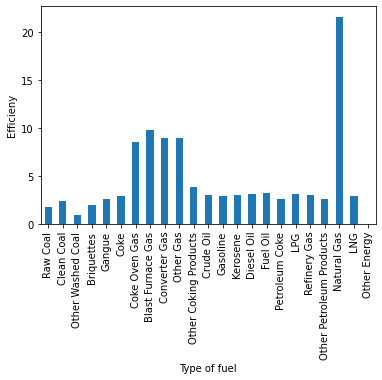

In [19]:
production_side.loc[:,'Efficiency'].plot(kind = 'bar',xlabel = 'Type of fuel',ylabel='Efficieny')

From this chart, we can see that natural gas is by far the most efficient type of fuel. There is then a group of different gases that are a lot less efficient than natural gas but are approximately twice as efficient as the remaining types of fuels. Coal is the least efficient type of fuel.

With the efficiency in hand, we can calculate how much $CO_2$ is emitted by each province.

In [20]:
co2_factor_regional = pd.DataFrame(np.matrix(production_data_cleaned,dtype='float') @ np.diag(production_side.loc[:,'Efficiency']),columns = col_1,index =  [year_iterable, provinces_iterable])
# np.diag(np.array(co2_factor.loc[year]).flatten())
co2_factor_regional

Raw Coal  Clean Coal  Other Washed Coal  Briquettes  \
2014 Beijing           868.443915    0.000000           0.000000    1.150331   
     Tianjin          4412.692725    0.000000           0.000000    0.000000   
     Hebei           15514.656044    0.000000          74.891576    0.000000   
     Shanxi          18855.597672   26.675676         631.748530    0.000000   
     Inner mongolia  33389.239172    0.000000          18.489037    4.718308   
...                           ...         ...                ...         ...   
2019 Shaanxi         10426.280641    0.000000        1128.995760    0.000000   
     Gansu            6281.724183    0.000000           0.000000    0.000000   
     Qinghai           802.855385    0.000000           0.000000    0.000000   
     Ningxia         12026.692549    0.000000          49.033651    0.000000   
     Xinjiang        22762.499271    0.000000           0.190904    0.000000   

                          Gangue  Coke  Coke Oven Gas  Blast Furnace Gas  \
2014 Beijing            0.000000   0.0       0.000000           0.000000   
     Tianjin            0.000000   0.0      12.062160         145.583015   
     Hebei            359.732138   0.0     169.896813        3320.525511   
     Shanxi          3026.565583   0.0     152.787366         441.151758   
     Inner mongolia  2356.670798   0.0      47.307622         468.155060   
...                          ...   ...            ...                ...   
2019 Shaanxi         1077.076495   0.0     473.760599         361.805102   
     Gansu            101.206561   0.0       7.528157         130.026766   
     Qinghai            0.000000   0.0       0.000000           0.000000   
     Ningxia          205.422885   0.0       6.587137         287.056833   
     Xinjiang         388.704381   0.0     129.860706         169.944689   

                     Converter Gas  Other Gas  Other Coking Products  \
2014 Beijing              0.000000        0.0                    0.0   
     Tianjin             19.254167        0.0                    0.0   
     Hebei              290.872248        0.0                    0.0   
     Shanxi               8.149438        0.0                    0.0   
     Inner mongolia       0.000000        0.0                    0.0   
...                            ...        ...                    ...   
2019 Shaanxi             11.462946        0.0                    0.0   
     Gansu               11.552500        0.0                    0.0   
     Qinghai              0.000000        0.0                    0.0   
     Ningxia              0.000000        0.0                    0.0   
     Xinjiang            41.911395        0.0                    0.0   

                     Crude Oil  Gasoline  Kerosene  Diesel Oil  Fuel Oil  \
2014 Beijing          0.000000       0.0       0.0    0.557264       0.0   
     Tianjin         22.379700       0.0       0.0    1.114527       0.0   
     Hebei            0.000000       0.0       0.0    3.374542       0.0   
     Shanxi           0.000000       0.0       0.0    0.000000       0.0   
     Inner mongolia   0.030202       0.0       0.0    1.981382       0.0   
...                        ...       ...       ...         ...       ...   
2019 Shaanxi          0.000000       0.0       0.0    1.052609       0.0   
     Gansu            0.000000       0.0       0.0    0.557264       0.0   
     Qinghai          0.000000       0.0       0.0    0.092877       0.0   
     Ningxia          0.000000       0.0       0.0    0.743018       0.0   
     Xinjiang         0.000000       0.0       0.0    0.928773       0.0   

                     Petroleum Coke       LPG  Refinery Gas  \
2014 Beijing              15.998486  0.062027      0.271074   
     Tianjin              49.764643  0.000000      0.000000   
     Hebei                 0.000000  0.000000      1.927639   
     Shanxi                0.000000  0.000000      0.000000   
     Inner mongolia        0.000000  0.000000      0.00000

Briefly glancing at this data, we can see that in most provinces raw coal contributes the most to $CO_2$ emissions - likely due to its lack of efficiency, however also because a higher quantity of coal is being consumed by the provinces compared to other types of fuel.

We sum up the $CO_2$ emissions for each province because we are also interested in looking at the aggregate effect of $CO_2$ emissions emitted by each province.

In [21]:
co2_factor = pd.DataFrame(co2_factor_regional.transpose().sum(),columns = ["CO2"])
co2_factor

CO2
2014 Beijing          1707.151784
     Tianjin          4723.086156
     Hebei           19752.713931
     Shanxi          23295.326553
     Inner mongolia  36295.636385
...                           ...
2019 Shaanxi         13507.245294
     Gansu            6555.430678
     Qinghai           803.380700
     Ningxia         12653.807309
     Xinjiang        23568.203196

[180 rows x 1 columns]

### 2.2 Supply Side

This project uses the network approach proposed by Qu et. al.(2017) to calculated the carbon emission from the production side. The sum of the inflow and outflow electricity should be the sum of the volume of electricity consumed and 'exported' to another province. In a model containing $n$ regions, the relationship can be described as:
$$x_i = p_i + \Sigma_{j=1}^{n}T_{j,i} = c_i + \Sigma^{n}_{j=1} T_{i,j}$$
where $x_i$ indicates the total electricity flow in $i^{th}$ region, $p_i$ indicates the electricity production in $i^{th}$ region and $T_{i,j}$ indicates the electricity transmitted from $i^{th}$ region to $j^{th}$ region and $c_i$ indicates the electricity consumption in $i^{th}$ region.

Define the diagonal matrix:

\begin{equation}
{x} =\begin{bmatrix} 
x_1 & 0 &  ... & 0 \\
0 & x_2 & ...& 0\\
... & ... &  ... & ...\\
0 & 0 & ... & x_n
\end{bmatrix}
\end{equation}

With the transmission data between n regions, we can get a matrix of transmission.
\begin{equation}
   T = \begin{bmatrix}
    0 & T_{1,2} & ... & T_{1,n}\\
    T_{2,1} & 0 & ... & T_{2,n}\\
    ... & ... & ... & ...\\
    T_{n,1} & T_{n,2} & ... & 0
    \end{bmatrix}
\end{equation}

Define the direct outflow matrix B:
\begin{equation}
 B = x^{-1}\hat T = \begin{bmatrix}
0 & \frac{T_{1,2}}{x_1} &  ... &  \frac{T_{1,n}}{x_1}\\
\frac{T_{2,1}}{x_2} & 0 & ... & \frac{T_{2,n}}{x_2}\\
... & ... & ... & ... \\
\frac{T_{n,1}}{x_n} & \frac{T_{n,2}}{x_n} & ... & 0
\end{bmatrix}
\end{equation}

B(i,j) here indicates the percentage of electricity transmitted from $i^{th}$ region to $j^{th}$ region in the total amount of transmission in $i^{th}$.

From equation (2), we can get the equation below:
\begin{equation}
x = p+xB =
\begin{bmatrix}
p_1 & p_2 & ... & p_n 
\end{bmatrix}
+
\begin{bmatrix}
x_1 & x_2 & ... & x_n
\end{bmatrix}B
\end{equation}

where x and p are row vectors of 1xn and indicates the total amount of electricity transmitted and produced respectively.

From equation (4), we can get
\begin{equation}
    x = p[I-B]^{-1} = pG
\end{equation}

Where I is an identity matrix, $G=[1-B]^{-1} = I + B + B^2 + B^3 + ... $ indicates the total transmission between regions(with intermediate and non-intermediate regions included). Its element G(i,j) indicates the percentage of electricity produced by $i^{th}$ region and transmitted to $j^{th}$. I indicates the electricity produced and consumed locally. $B$ indicates the electricity transmitted to other regions without any intermediates. $B^2$ indicates the electricity transmitted with one intermediate. $B^3$ indicates the electricity transmitted with two intermediates. This can be applied to higher order of the matrix B.

Define production-consumption matrix:
\begin{equation}
    H = G \hat{c} \hat{x}^{-1}
\end{equation}

where $\hat{c}$ is the diagonal matrix with the electricity consumption in which the diagonal elements $\hat{c}(i,j)$ is the electricity consumed in $i^{th}$ region. H matrix relates electricity consumed and generated in different regions, in which its element of $H(i,j) = G_{i,j} * \frac{c_j}{x_j}$ indicates the percentage of electricity produced by $i^{th}$ region and consumed by $j^{th}$.

Then we will relate the amount of carbon emission caused by electricity production and the amount consumed in $i^{th}$ region.
\begin{equation}
E^C = E^G H
\end{equation}
Where the element of $E^C(i,j)$ is the implicit carbon emission caused by electricity produced by $i^{th}$ region and consumed by $j^{th}$ region. For matrix $E^G$:
\begin{equation}
E^G=\begin{bmatrix}
e^G_1 & 0 & ... & 0 \\
0 & e_2^G & ... & 0 \\
... & ... & ... & ...\\
0 & 0 & ... & e^G_n
\end{bmatrix}
\end{equation}

With the equations above, we can calculate the supply-side electricity emission of carbon:
\begin{equation}
E^C_i = \Sigma_{j=1}^{n} E_{i,j}^C
\end{equation}
We can also get the carbon emission coefficient caused by the supply-side electricity production of $i^{th}$ region $ef^c$:
\begin{equation}
ef^c = \frac{E_i^C}{EC}
\end{equation}
Where $EC = P_i + \Sigma_{i=1}^{n}T_ji - \Sigma^n_{i=1}T_{ij}$ indicates the total electricity supplied by $i^{th}$ region, which equals to the electricity produced by $i^{th}$ region plus electricity flowing in and minus electricity flowing out.


In [22]:
def DataFrameize(x):
    """
    input: a numpy matrix
    output: a dataframe with provinces as index and columns
    """
    return pd.DataFrame(x,index = provinces, columns=provinces)

In [23]:
def calculate(tra,gen,year):
    """
    input: 
        tra = transmission_data_cleaned.loc[year]
        gen = pro_data.loc[year]
        year = year as an int 
    output: the implicit transmission matrix Ec
    """
    
    # all the electricity flowing in the province
    all_flow_in = tra.loc[year].transpose().sum()
    
    # all the electricity flowing out of the province
    all_flow_out = tra.loc[year].sum()
    
    # total electricity flow x
    x = tra.loc[year].transpose().sum() + pro_data.loc[year,'Production']
    
    # x_hat
    x_diag = np.diag(np.array(x))
    
    # x^(-1)
    x_inverse = np.linalg.inv(np.matrix(x_diag,dtype = 'float'))
    
    # direct outflow matrix
    B = x_inverse @ tra.loc[year].transpose()
    
    # identity matrix
    I = np.eye(30)
    
    # matrix G
    G = np.linalg.inv(np.matrix(I-B,dtype='float'))
    
    # calculate consumption
    con = np.array(gen.loc[year,'Production'] + all_flow_in - all_flow_out)
    
    # con_hat
    con_diag = np.diag(con)
    
    # H_matrix
    H = G @ (con_diag @ x_inverse)
#     print(B)
    #Eg
    Eg = np.diag(np.array(co2_factor.loc[year]).flatten())
    
    #Ec
    Ec = Eg @ H
#     print(Ec)
    Ec2= DataFrameize(Ec)
    carbon_emission_outflow = Ec2.transpose().sum()
    carbon_emission_inflow = Ec2.sum()
    co2_emission_factor = carbon_emission_inflow/con*(10**6)
    Ec3 = Ec / con *(10**6)
    carbon_emission_per_kwh = DataFrameize(Ec3)
#     print(Ec2)
    return Ec2

In [24]:
# the following dataframe contains the Ec of 2014-2019
Ec_2014 = calculate(transmission_data_cleaned,pro_data,2014)
Ec_2015 = calculate(transmission_data_cleaned,pro_data,2015)
Ec_2016 = calculate(transmission_data_cleaned,pro_data,2016)
Ec_2017 = calculate(transmission_data_cleaned,pro_data,2017)
Ec_2018 = calculate(transmission_data_cleaned,pro_data,2018)
Ec_2019 = calculate(transmission_data_cleaned,pro_data,2019)
# Ec.loc[2014]

In [25]:
Ec = pd.concat( [Ec_2014,Ec_2015,Ec_2016,Ec_2017,Ec_2018,Ec_2019],axis = 0)
Ec = Ec.set_index([year_iterable,provinces_iterable])

### 2.3 Further Visualization

#### 2.3.1 2D-visualization

It is also useful to look at the correlation between the different types of fuels, as this can guide our government advice towards potential solutions on how they can tackle their emissions.

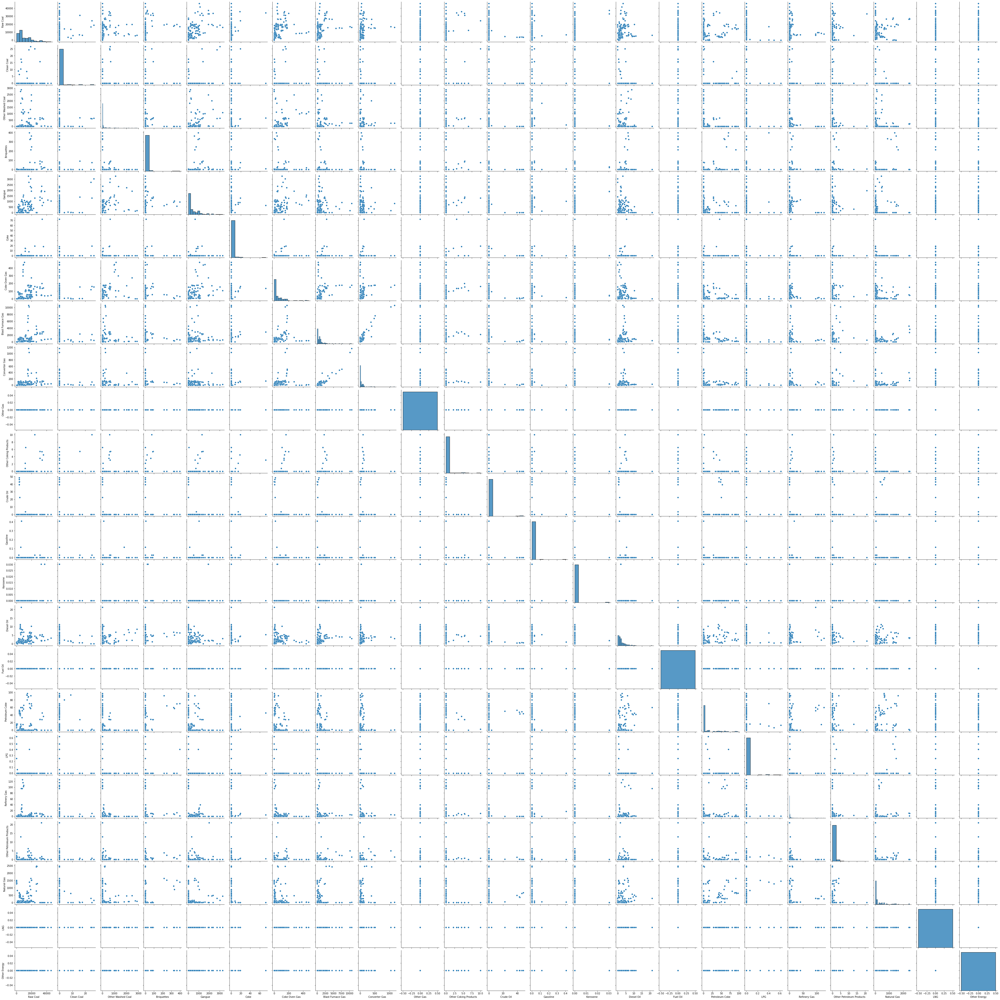

In [26]:
import seaborn as sns
sns.pairplot(co2_factor_regional[col_1])

This diagram is too messy, so we generated a clearer picture by using only some of the variables. 

We will focus on raw coal, other washed coal, blast furnace gas, converter gas, diesel oil and natural gas, because, from looking at the data, these are the types of fuels that are used the most by the Chinese provinces. It is also useful to compare the first types to natural gas because, from our earlier analysis, natural gas is the most efficient type of fuel.

In [27]:
new_col = ['Raw Coal','Other Washed Coal',
           'Blast Furnace Gas',
           'Converter Gas','Diesel Oil','Natural Gas']

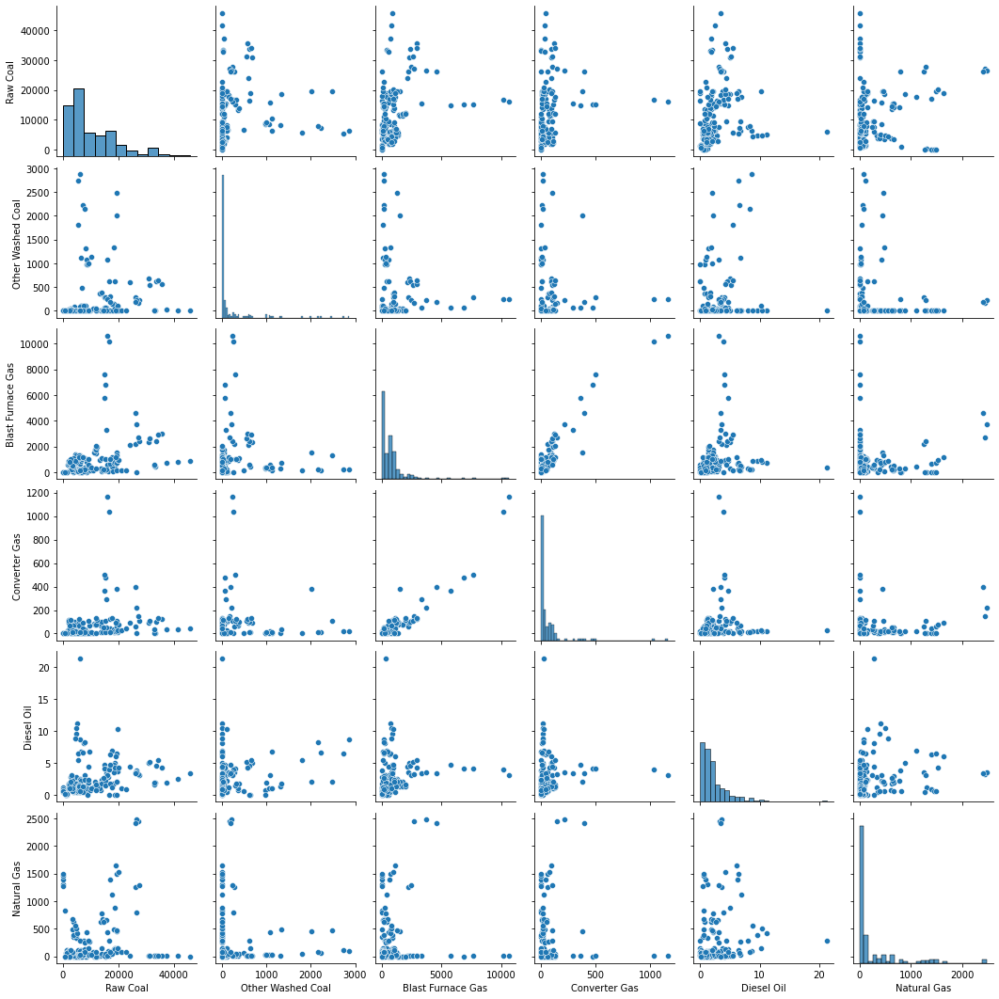

In [28]:
import seaborn as sns
sns.pairplot(co2_factor_regional[new_col])

These scatter plots show us that there seems to be a strong positive correlation between converter gas and blast furnace gas. The others mainly show weak positive correlation or a correlation which suggests that the two types of fuels are substitutes to each other. This is shown by clusters along the two axis whereas the use of one fuel increases the other remains relatively low. Then, close to zero the use of the other fuel varies but is quite high.

This is particularly useful when looking at the relationship between natural gas, the fuel we found was most efficient earlier, and the other less efficient fuels. We can observe that it seems to be a substitute with converter gas, blast furnace gas and other washed coal. Then there is a weak positive correlation with diesel oil and raw coal.


Now we consider what the proportion of each type of fuel is contributing to the $CO_2$ emissions in each province.

In [29]:
# these are the acronym of the 30 provinces in china, we are having them to make the chart clearer.
provinces_acronym = ['BJ','TJ','HE','SX','IM','LN','JL','HLJ','SH','JS','ZJ','AH','FJ',
                     'JX','SD','HA','GD','GX','HA','HB','HN','CQ','SC','GZ','YN',
                    'SN','GS','QH','NX','XJ']

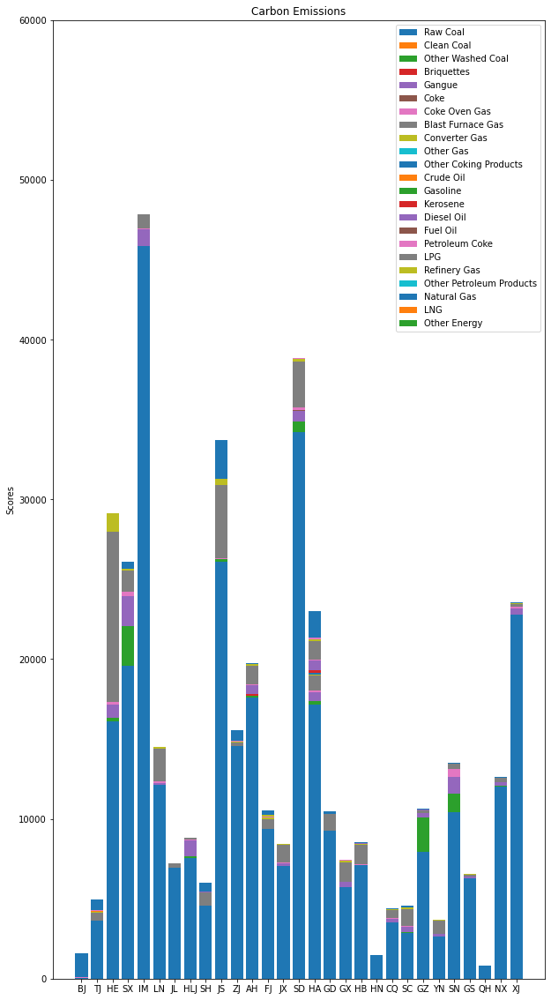

In [30]:
labels = provinces_acronym
# width = 0.35       
# the width of the bars: can also be len(x) sequence
bottom = np.zeros(30)
fig, ax = plt.subplots(figsize = (10,20))
ax.set_ylim(0,60000)
for i in col_1:
    ax.bar(labels, co2_factor_regional.loc[2019,i],bottom = bottom, label = i)
    bottom = bottom + co2_factor_regional.loc[2019,i]
ax.set_ylabel('Scores')
ax.set_title('Carbon Emissions')

ax.legend()
co2_factor_regional.index = [year_iterable, provinces_iterable]
# plt.show()

This notably shows that raw coal is the main type of fuel used in each province, and thus contributes the most to $CO_2$ emissions. There are also substantial proportions of blast furnace gas in Hebei, Jiangsu and Shandong.

It also shows that the provinces with the highest emissions are Inner Mongolia, followed by Shandong and then Jiangsu. These provinces are emitting a substantially higher volume of carbon emissions that compared to the rest of the country. 

There are also notably high emissions from Hebei, Shanxi, Anhui, Hainan and Xinjiang.

We can also look at how the carbon emissions varied across the years, to see the progression of carbon emissions over time.

In [31]:
provinces_acronym_iterable = [i for j in range(len(year)) for i in provinces_acronym ]
co2_factor_regional2 = pd.DataFrame(np.matrix(production_data_cleaned,dtype='float') @ np.diag(production_side.loc[:,'Efficiency']),columns = col_1,index =  [provinces_acronym_iterable,year_iterable])
# co2_factor_regional2

In [32]:
Ec2 = pd.concat([Ec_2014.transpose(),Ec_2015.transpose(),Ec_2016.transpose(),Ec_2017.transpose(),Ec_2018.transpose(),Ec_2019.transpose()],axis = 0)
Ec2 = Ec2.set_index([provinces_iterable,year_iterable])
# Ec2.loc['Beijing']

Text(0.5, 1.0, 'Implicit Carbon Transmission to Beijing')

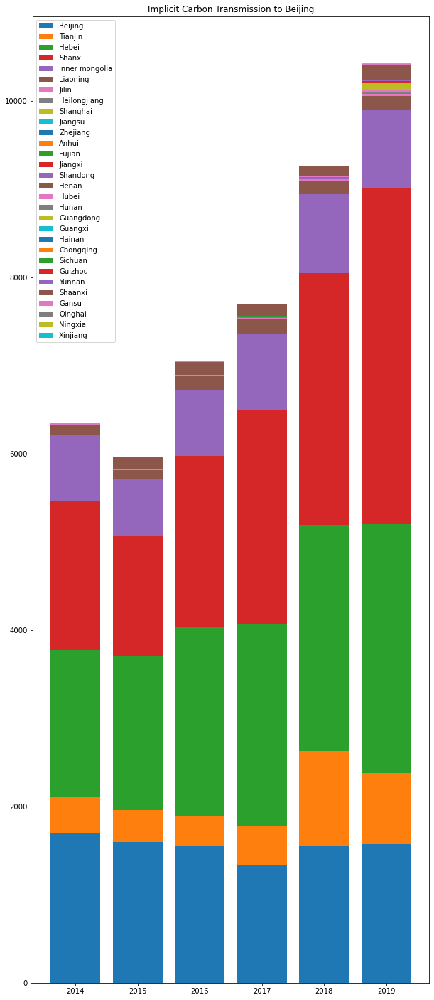

In [33]:
fig, ax = plt.subplots(figsize = (10,25))
labels = year
bottom = np.zeros(6)
for i in provinces:
#     print(i)
    ax.bar(x= labels,height = Ec2.loc['Beijing',i], bottom = bottom ,label = i)
    bottom = bottom + Ec2.loc['Beijing',i]
ax.legend(loc = 'upper left')
ax.set_title("Implicit Carbon Transmission to Beijing")

We can see that the carbon emissions in Beijing contributed by Beijing themselves were quite stable over the years and was even decreasing. This decrease comes from the fact that the government moved factories away from the capital due to the need of more important services inside the city. Since the costs of transmission between provinces and their infrastructure are so low, it is more beneficial to have these factories located outside of the city. 

The graph shows that implicit carbon transmissions being brought to Beijing from other provinces increased year on year from 2014 to 2019, with the exception of 2015 that saw a slight decrease, approximating to an overall increase of $98\%$.

This is a very large increase, which emphasises the importance of the need to look at implicit carbon transmissions between provinces as well as the emissions from production in the provinces themselves.

We are also able to observe that Hebei, Shanxi, Inner Mongolia and Tianjin are the major contributors to the implicit carbon transmissions, which corresponds to the majority $CO_2$ emitters observed in the previous graph.

#### 2.3.2 3D-chart

We can use a 3D chart to see the relationship between the emissions from the different types of fuel. As natural gas is the most efficient type of fuel it is useful to use this fuel as a baseline and compare it to the other fuels, because if there is the need to use fossil fuels, then the most efficient one should be used in order to reduce carbon emissions.

Here we compare it to raw coal and coke oven gas, but we can change the types of fuel easily below to create the same graph to use for comparison.

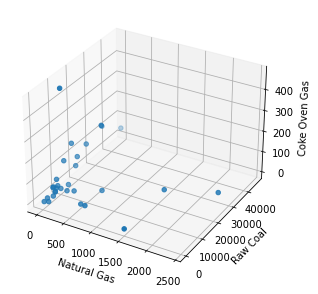

In [34]:
def randrange(n, vmin, vmax):
    """
    Helper function to make an array of random numbers having shape (n, )
    with each number distributed Uniform(vmin, vmax).
    """
    return (vmax - vmin)*np.random.rand(n) + vmin

fig = plt.figure(1,figsize=(5,5))
ax = fig.add_subplot(projection='3d')

# For each set of style and range settings, plot n random points in the box
# defined by x in [23, 32], y in [0, 100], z in [zlow, zhigh].
for m, zlow, zhigh in [('o', -100, -100)]:
    xs = np.array(co2_factor_regional.loc[2019,'Natural Gas'])
    ys = np.array(co2_factor_regional.loc[2019,'Raw Coal'])
    zs = np.array(co2_factor_regional.loc[2019,'Coke Oven Gas'])
    ax.scatter(xs, ys, zs, marker=m)

ax.set_xlabel('Natural Gas')
ax.set_ylabel('Raw Coal')
ax.set_zlabel('Coke Oven Gas')

plt.show()

We can see that a large proportion of provinces do not use that much natural gas or coke oven gas but there are a few that produce a lot of emissions from raw coal and natural gas. 

This tells us a lot about the distribution of provinces because we can deduce that many provinces do not produce their own emissions so must be using a lot of electricity transmitted by the higher emitting provinces.

Therefore, we will go on to create charts to show the transmission between the provinces.

#### 2.3.3 Sankey Chart

As there is a lot of movement of between and within provinces, we are interested in looking at the flow of transmissions of $CO_2$ emissions between the provinces.

However, because there are too much $CO_2$ transmissions within the same provinces we deleted them in the matrix in order to obtain a clearer picture, as our focus is on the transmission between provinces. We also deleted the small volume transmissions.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
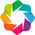

In [35]:
hv.extension('bokeh', 'matplotlib')

In [36]:
def Sankey(Ec):
    """
    input: implicit carbon emission matrix
    output: sankey chart
    """
    %output widgets='live' holomap='scrubber'
    Chord = np.matrix(Ec,dtype = 'float').tolist()
    # because there is too much co2 transmission within the same provinces, so we deleted them in the matrix 
    # to get a clearer pic, we also deleted those transmission with small volume
    
    for i in range(len(Chord)):
        for j in range(len(Chord[i])):
            if Chord[i][j]<1000:
                Chord[i][j] =0
            else:
                Chord[i][j] = round(Chord[i][j])
                
    # Get a dataframe with three columns ['start','destination','volume']
    chord_chart = pd.DataFrame(columns = ['Start','Destination','Volume'],index = list(range(900)))
    

    k = 0
    for i in range(30):
        for j in range(30):
            chord_chart.iloc[k,2] = Chord[i][j]
            chord_chart.iloc[k,0] = provinces[i]
            chord_chart.iloc[k,1] = provinces[j]
            k = k + 1
    sankey_chart = chord_chart.copy()
    sankey_chart = sankey_chart.drop(sankey_chart[(sankey_chart['Volume'] == 0) | (sankey_chart['Start'] == sankey_chart['Destination'])].index)
    sankey_chart['Start'] = sankey_chart['Start'].astype('str') + '_out'
    sankey_chart['Destination'] = sankey_chart['Destination'].astype('str') + '_in'
    
    sankey = hv.Sankey(sankey_chart.values.tolist(),['Start','Destination'])

    sankey.opts(width=600, height=400,
                cmap='Set1',edge_color=dim('Start').str())
    hv.save(sankey, 'graph.html')
    show(hv.render(sankey))

In [37]:
%output widgets='live' holomap='scrubber'
Sankey(Ec_2019)

We can see from the Sankey Chart that there are many transmissions between the provinces, with the ones on the left being the major emitters, transmitting the most electricity to other provinces and the ones on the right being the provinces receiving the most. 

Again, we are able to observe that Inner Mongolia is the largest transmitter, along with Shanxi.

#### 2.3.4 Chord Diagram

As there are so many transmissions between provinces, we can create a clearer picture by using a Chord Diagram.

In [38]:
def generate_chord(Ec):
    Chord = np.matrix(Ec,dtype = 'float').tolist()
    
    # because there is too much co2 transmission within the same provinces, so we deleted them in the matrix 
    # to get a clearer pic, we also deleted those tranmission with small volume
    for i in range(len(Chord)):
        for j in range(len(Chord[i])):
            if Chord[i][j]<100:
                Chord[i][j] =0
            else:
                Chord[i][j] = round(Chord[i][j])
    
    # Get a dataframe with three columns ['start','destination','volume']
    chord_chart = pd.DataFrame(columns = ['Start','Destination','Volume'],index = list(range(900)))
    k = 0
    for i in range(30):
        for j in range(30):
            chord_chart.iloc[k,2] = Chord[i][j]
            chord_chart.iloc[k,0] = provinces[i]
            chord_chart.iloc[k,1] = provinces[j]
            k = k + 1
    chord_chart = chord_chart.drop(chord_chart[(chord_chart['Volume'] == 0) | (chord_chart['Start'] == chord_chart['Destination'])].index)
           
    chord_chart.to_csv(add_1 + 'data.csv')
    data = pd.read_csv(add_1 + 'data.csv').iloc[:,1:]
    
#     draw the chart 
#     hv.extension('bokeh')
    %output widgets='live' holomap='scrubber'
    
    output_notebook()
    node = pd.DataFrame(provinces,columns =['provinces'])
    nodes = hv.Dataset(node, 'provinces',)
    print(data)
    chord = hv.Chord((data,nodes))
    chord.opts(
        opts.Chord(cmap='Tab20', edge_color=dim('Start').str(), 
                   height=900,
                   width=900,
                   edge_line_width=1,
                   edge_line_alpha=0.5,
                   labels='provinces',
                   node_color='provinces'))
    hv.save(chord, 'chord.html')
    show(hv.render(chord))
    return data

In [39]:
a = generate_chord(Ec_2019)
# a

Loading BokehJS ...

       Start Destination  Volume
0    Tianjin     Beijing     801
1      Hebei     Beijing    2819
2      Hebei     Tianjin     190
3     Shanxi     Beijing    3814
4     Shanxi       Hebei    2449
..       ...         ...     ...
64   Ningxia    Shandong    2032
65  Xinjiang    Zhejiang     158
66  Xinjiang       Anhui     730
67  Xinjiang       Henan    2692
68  Xinjiang       Gansu     480

[69 rows x 3 columns]


The diagram shows that there are many connections between all the provinces. This therefore suggests that, when targeting emissions, the government should not only focus on targeting each province, but also the transmission between the different provinces, as this makes up such a large portion of each province's emissions.

From the Chord Diagram we can see that there are large transmissions primarily between Hebei and Inner Mongolia, Hebei and Shanxi, Inner Mongolia and Liaoning, Anhui and Zhejiang. This corresponds with the findings from earlier that showed that Hebei, Shanxi and Inner Mongolia are the largest $CO_2$ emitters in China, as they are also transmitting and receiving so much from other provinces.

### 3. Further Analysis

We can use K-means and network analysis, to cluster the provinces in different groups based on their emmissions.

#### 3.1 K-means Analysis

K-means analysis is an unsupervised cluster analysis, which means that the program groups the data together with similar properties, without us giving it any criteria. This is useful because it means that it is unbiased, therefore, it is helpful to the interpretation of our data.

In [40]:
from sklearn.cluster import KMeans

estimator = KMeans(n_clusters = 3).fit(production_data_cleaned.loc[2019].astype('float').values)
label_pred = estimator.labels_ 
centroids = estimator.cluster_centers_ 
inertia = estimator.inertia_
# label_pred

In [41]:
list(zip(provinces,label_pred))

[('Beijing', 1),
 ('Tianjin', 1),
 ('Hebei', 0),
 ('Shanxi', 0),
 ('Inner mongolia', 2),
 ('Liaoning', 1),
 ('Jilin', 1),
 ('Heilongjiang', 1),
 ('Shanghai', 1),
 ('Jiangsu', 0),
 ('Zhejiang', 0),
 ('Anhui', 0),
 ('Fujian', 1),
 ('Jiangxi', 1),
 ('Shandong', 2),
 ('Henan', 0),
 ('Hubei', 1),
 ('Hunan', 1),
 ('Guangdong', 0),
 ('Guangxi', 1),
 ('Hainan', 1),
 ('Chongqing', 1),
 ('Sichuan', 1),
 ('Guizhou', 1),
 ('Yunnan', 1),
 ('Shaanxi', 1),
 ('Gansu', 1),
 ('Qinghai', 1),
 ('Ningxia', 1),
 ('Xinjiang', 0)]

The provinces have been clustered into three groups based on the similarity of their $CO_2$ emissions. 

In group 2, the highest emitters category, there is Inner Mongolia and Shandong, which corresponds to our earlier findings. Then group 1 and 0 contain the other provinces.

#### 3.2 Network Analyzing/ Spectral graph clustering

We can create a network map to show how the different provinces are relate to each other.

For further details, please check [Prof.Philip Solimine's note](https://github.com/doctor-phil/analyzing-economic-networks/blob/main/Analyzing_economic_networks.ipynb)

In [42]:
import networkx as nx

In [43]:
G = nx.DiGraph() #initialize a new graph

In [44]:
edgelist = [tuple([a.loc[i,'Start'],a.loc[i,'Destination'],a.loc[i,'Volume']]) for i in range(len(a))]
# edgelist

In [45]:
for i in edgelist:
    if i[2]>500:
        G.add_edge(i[0], i[1], weight=i[2])
        G.add_nodes_from([i[0],i[1]])

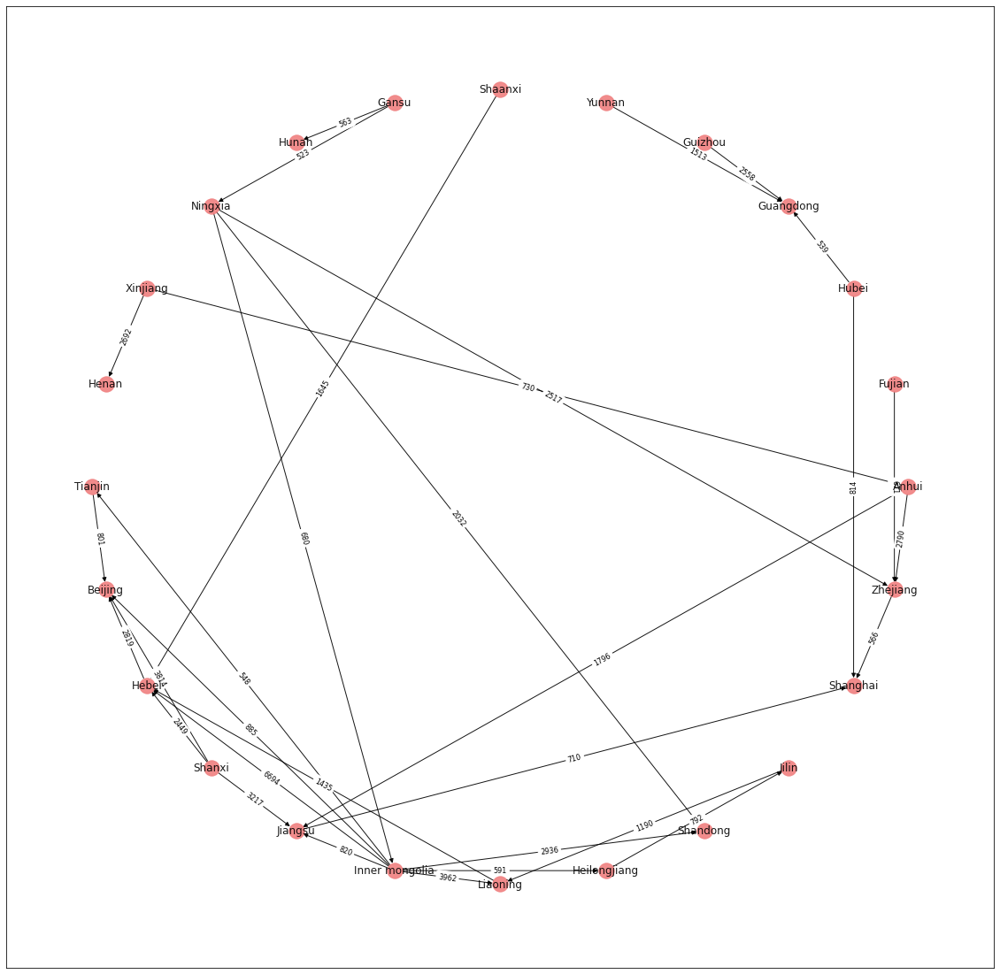

In [46]:
network_layout = nx.shell_layout(G)
plt.figure(3,figsize=(20,20))
node_labels = nx.get_edge_attributes(G,'weight')
nx.draw_networkx_edge_labels(G, network_layout,font_size=8,edge_labels=node_labels)
nx.draw_networkx(G, network_layout, with_labels=True,alpha = 0.9,width=1,font_size=12,node_color = "lightcoral")

Each node in the network represents a province and nodes are connected by an edge if the provinces are linked with each other; in our case transmitting carbon to each other. It shows the interconnectedness of the provinces where some of the nodes have more connections than others because they transmit emissions to more provinces.

We can see that Inner Mongolia, Shandong and Ningxia are very central to the network, in comparison to Hunan, Yunnan and Henan for example.

The arrows on the edges show the direction of transmission and the quantity of the emissions transmitted are included on the edge.

To see which province has the most links, we are interested in the degree of the nodes and the network. We can see this by drawing a histogram of all the nodes with each degree.

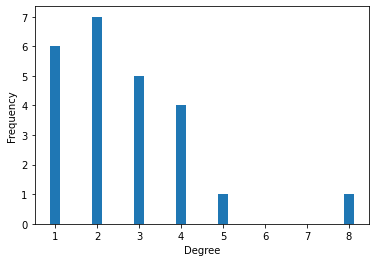

In [47]:
deg = G.degree()
import matplotlib.pyplot as plt
plt.bar(*np.unique([d for n,d in deg], return_counts=True),width=0.25) 
# this could also be done using plt.hist([d for n,d in deg]), but this way looks nicer
# plt.xticks([0,1,2,3,4,]);
plt.xlabel("Degree");
plt.ylabel("Frequency");

We can see that only 1 node has degree 8, meaning it has 8 links, and another one has 5, then there are many with 1, 2, 3 or 4 links.

Inner Mongolia is likely the one with 8 links as it is the highest emitter and is most interconnected with the other provinces.

For further analysis we can use spectral graph clustering because of the unique properties of eigenvalues. This enables us to find a way to partition the network. This could be useful for the Chinese government because there could be an efficient way of reducing the interconnectedness between provinces which could reduce the $CO_2$ emissions more rapidly.

In [48]:
G = nx.to_undirected(G)

In [49]:
L = nx.laplacian_matrix(G).todense()

In [50]:
centrality = nx.eigenvector_centrality(G) # compute eigenvector centrality using networkx
centrality

{'Tianjin': 0.22836610660449186,
 'Beijing': 0.35917843095674623,
 'Hebei': 0.3864262281253954,
 'Shanxi': 0.25585195275579126,
 'Jiangsu': 0.2547546676521057,
 'Inner mongolia': 0.5337142624906314,
 'Liaoning': 0.26331890658762014,
 'Heilongjiang': 0.16448678900806846,
 'Shandong': 0.19632952418019908,
 'Jilin': 0.10941536470323839,
 'Shanghai': 0.10329030324292074,
 'Zhejiang': 0.12052644223550435,
 'Anhui': 0.10320742711691053,
 'Fujian': 0.03082668599726574,
 'Hubei': 0.028568635179550838,
 'Guangdong': 0.008407226200867033,
 'Guizhou': 0.00215044110431888,
 'Yunnan': 0.00215044110431888,
 'Shaanxi': 0.09883211757955164,
 'Gansu': 0.06401421438500675,
 'Hunan': 0.016372495521519516,
 'Ningxia': 0.23391543248733343,
 'Xinjiang': 0.02824476154651642,
 'Henan': 0.00722418741476912}

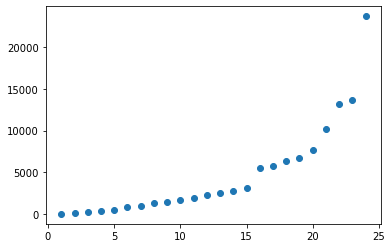

In [51]:
(u,v) = np.linalg.eig(L) # get the eigenvalue decomposition of the laplacian matrix
u_sorted = np.sort(u) # sort the eigenvalues
v_sorted = v[:, u.argsort()] # sort the eigenvectors to match the eigenvalues
plt.scatter(range(1,25),u_sorted) # show a scatterplot of the eigenvalues in increasing order

The first thing we can observe is that there're just 25 eigenvalues here, which means that the rank of the laplacian matrix is 25. So there're some of the provinces having the same centrality.

Also, our graph is fully connected as there is only one eigenvalue equal to zero.

There are no big jumps between the first 15 eigenvalues so we can see that there is a lot of segregation in this network, which makes it easy to partition. 

Therefore, we can colour the nodes by their entries in the Fiedler vector (the eigenvector corresponding to the second lowest eigenvalue):

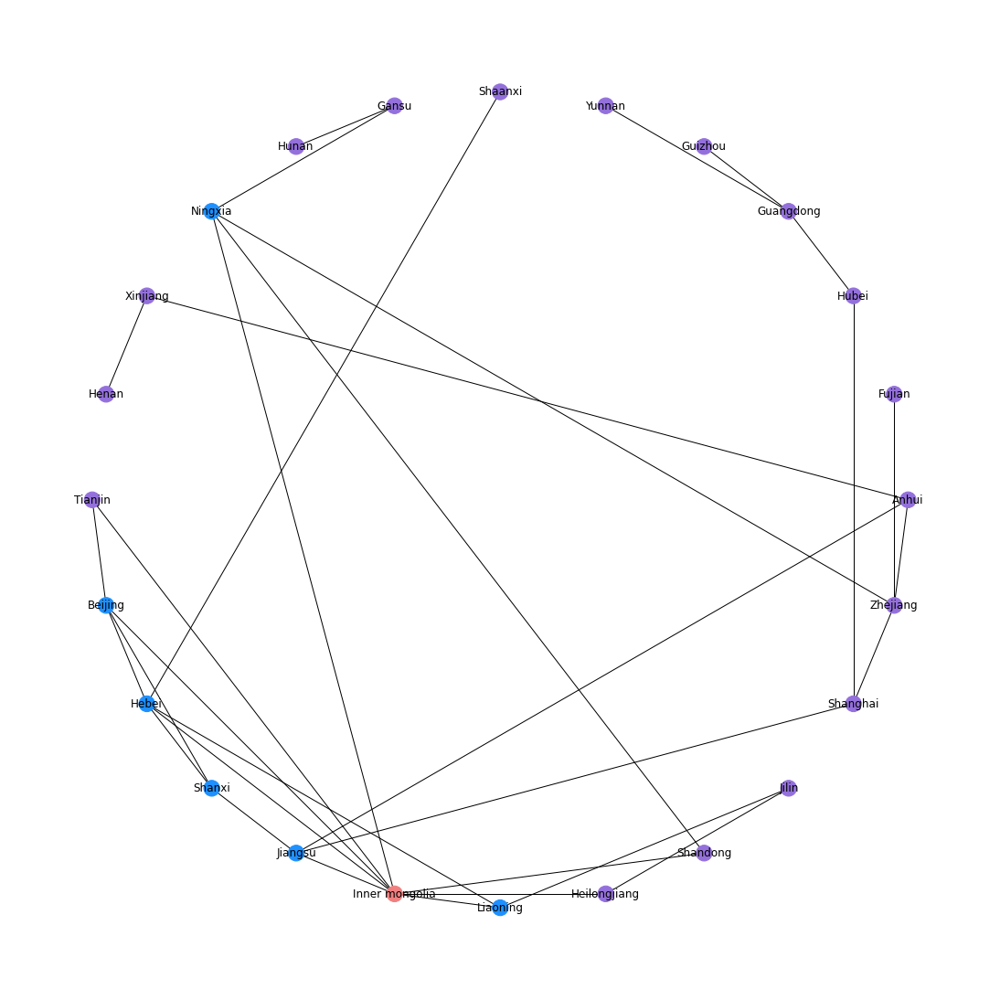

In [52]:
colors = [ "lightcoral" for i in range(1,25) ] # assign a nice reddish color to all nodes
centrality_list = pd.DataFrame([centrality[i] for i in centrality])
top_7 = centrality_list.nlargest(7,columns=[0]).values.flatten()
top = centrality_list.max().values
j = -1
for i in centrality:
    j=j+1
#     print(centrality[i])
    # for any nodes that have a negative entry, replace this with a nice purplish color
    if (centrality[i] == top):
        colors[j] = "lightcoral" 
    elif (centrality[i] in top_7):
        colors[j] = "dodgerblue"
    else:
        colors[j]= "mediumpurple"

plt.figure(3,figsize=(15,15)) 
nx.draw(G,network_layout,node_color=colors,with_labels=True) # draw the result

We see that there are three groups of provinces where the light coral node is the most central to the network, and has the most links, which shows homophily in the network. The blue nodes are the next most central group, followed by the purple nodes.

The spectral homophily partitions the network, with Inner Mongolia being the central hub, as shown by the light coral colour of the node.

We are not surprised by this because from our chord diagram showing the interconnectedness between the provinces, we achieved a similar result. 

The large size of the clusters shows that the flow of transmissions of $CO_2$ emissions is very high, which means that even though we can see ways we could partition the nodes, this will be very complicated in real life as the network is very established.

### 4. Conclusion

From our analysis of the different situations of the provinces, we find that Inner Mongolia and Shandong are the two major polluters in China. Furthermore, the most important takeaway is that many emissions are transmitted between provinces and that some provinces who do not seem to be emitting much because their production are low are actually receiving a lot of their electricity from higher emitting provinces, which means that their implicit carbon emissions are a lot higher than is documented. This emphasises the fact that accountability should not only lie in the provinces that seem to be emitting the most but also to the provinces that they are transmitting their electricity to.

Therefore, some possible solutions we propose to the Chinese government are:
- Firstly, the Chinese government as well as the local government in each province should focus on tackling their carbon emissions from electricity production, focusing on reduction in production as well as the movement to more efficient fuel types, such as natural gas.


- Secondly, have each local government create policies that account for the implicit carbon emissions they are receiving from other provinces as well as the ones they are producing themselves. This could involve restrictions in the electricity they receive.


- Another possible solution is for provinces, such as Beijing who receive a lot more electricity than they produce (therefore, do not believe that they emit a lot but are emitting a lot implicitly), to subsidise the high emitting provinces they are receiving from. This will support the province they are receiving from to fund programs whose aim is to transition away from high emitting fuels. This is important because provinces such as Beijing have a higher GDP therefore, have more capital available to invest in such programs compared to other provinces.

### Limitations

Due to time constraints we have primarily focused on using the data from 2019 when analysing the data and creating our visualisations. For a more useful and accurate analysis to draw conclusions from, it would be better to use the whole dataset which includes data from 2014 to 2019 and therefore, apply more time series analysis.

Another thing we could look at is the increase in the use of renewable energy sources.

### Reference
Qu, Shen, Yun Li, Sai Liang, Jiahai Yuan, and Ming Xu. "Virtual CO2 emission flows in the global electricity trade network." Environmental science & technology 52, no. 11 (2018): 6666-6675.

Wendong Wei, Pengfei Li and Jiashuo Li."The framework of regional electricity-related carbon emissions accounting and its application." Chinese Demography, Resource and Environment 30 no. 07(2020):38-46. 

##### By Tracy Du and Elody Alcaraz